# Projet 8 :

# Déployez un modèle dans le cloud

## Préambule :

Une start-up AgriTech nommée "Fruits!" se fixe pour objectif d'introduire des solutions innovantes dans le domaine de la récolte de fruits, en mettant en avant la préservation de la diversité fruitière comme priorité. Cette vision se matérialise par le développement de robots cueilleurs intelligents capables de fournir des traitements adaptés à chaque variété de fruit.

Dans un premier temps, l'entreprise cherche à accroître sa visibilité en proposant au grand public une application mobile. Cette application permettra aux utilisateurs de prendre des photos de fruits et d'obtenir des informations exhaustives sur ces produits. L'initiative vise à sensibiliser le grand public à la diversité des fruits tout en créant une première version du moteur de classification d'images dédié aux fruits.

De plus, le développement de cette application mobile contribuera à la mise en place de la première itération de l'architecture Big Data nécessaire au projet.

## Mission

La mission consiste à prendre en charge les travaux effectués par l'alternant et à finaliser la chaîne de traitement. Il n'est pas requis de réaliser l'entraînement d'un modèle pour le moment. L'essentiel est d'établir les premières étapes du traitement qui seront utiles lorsque nous devrons gérer des volumes de données plus importants à l'avenir !

In [1]:
!pip install pyspark

In [2]:
import os
from PIL import Image
import matplotlib.pyplot as plt
from io import StringIO
import numpy as np
import pandas as pd


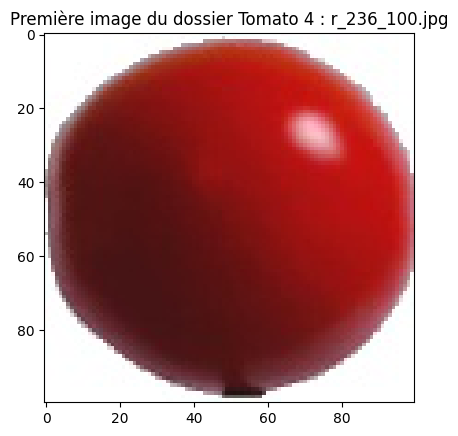

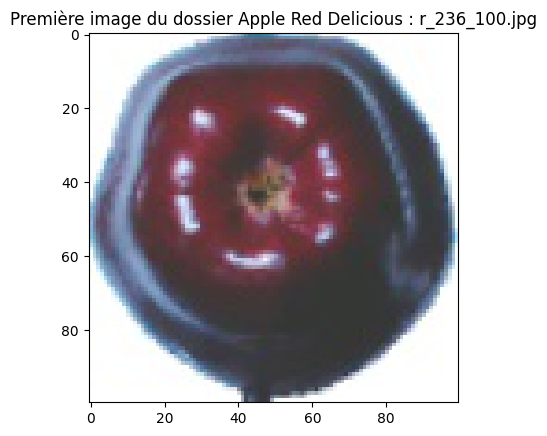

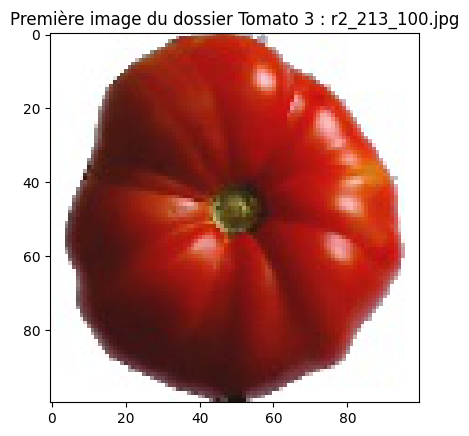

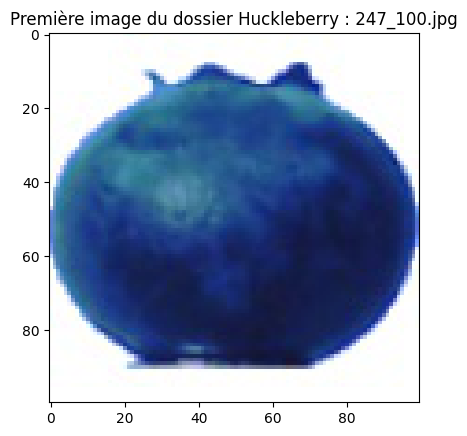

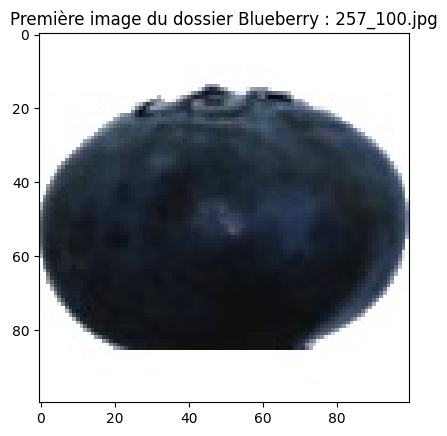

...

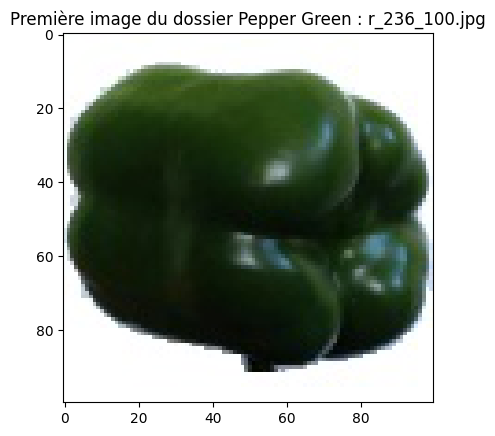

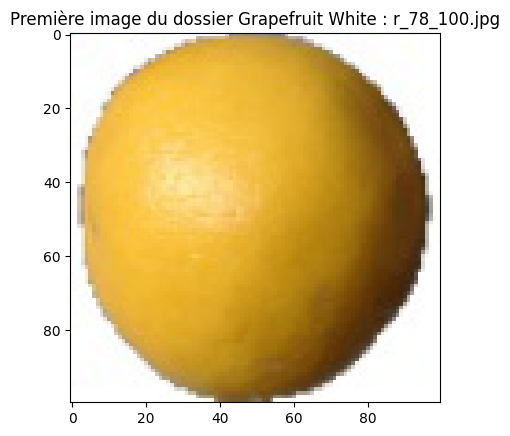

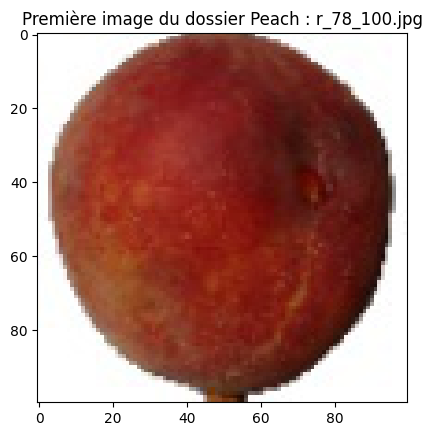

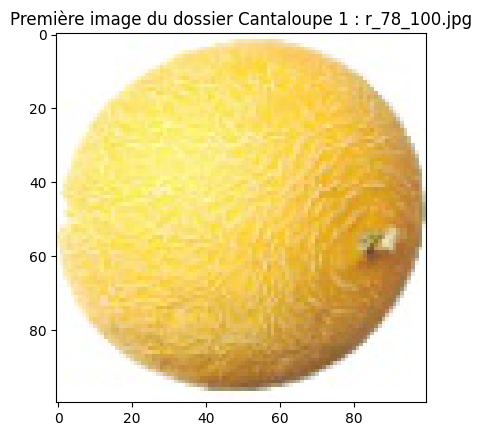

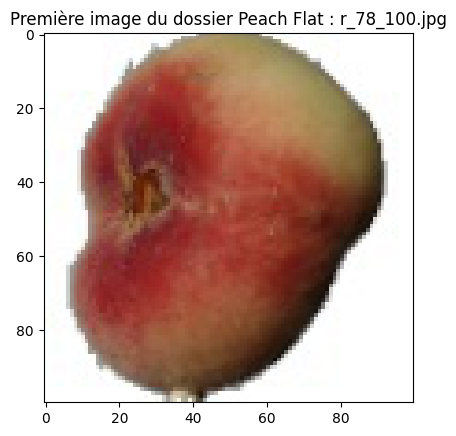

In [3]:

# Chemin complet vers le répertoire "Entraînement" (Training) 
train_folder_path = "/Users/azizi/Desktop/fruits/fruits-360_dataset/fruits-360/Training/"

# Chemin complet vers le répertoire "Test" 
test_folder_path = "/Users/azizi/Desktop/fruits/fruits-360_dataset/fruits-360/Test/"

# Liste des dossiers de fruits dans le répertoire "Entraînement" (Training)
fruit_folders_train = os.listdir(train_folder_path)

# Liste des dossiers de fruits dans le répertoire "Test"
fruit_folders_test = os.listdir(test_folder_path)

# Parcourir les dossiers de fruits dans le répertoire "Entraînement" (Training)
for fruit_folder in fruit_folders_train:
    # Créer le chemin complet vers le dossier du fruit
    fruit_folder_path = os.path.join(train_folder_path, fruit_folder)
    
    # Vérifier que le chemin pointe vers un répertoire
    if os.path.isdir(fruit_folder_path):
        # Liste des fichiers (images) dans le dossier du fruit
        fruit_images = os.listdir(fruit_folder_path)
        
        # Afficher la première image du dossier du fruit
        if fruit_images:
            first_fruit_image_name = fruit_images[0]
            first_fruit_image_path = os.path.join(fruit_folder_path, first_fruit_image_name)
            # Vérifier que le chemin pointe vers un fichier image (par exemple, .jpg, .png, .jpeg, etc.)
            if os.path.isfile(first_fruit_image_path):
                first_fruit_image = Image.open(first_fruit_image_path)
                plt.imshow(first_fruit_image)
                plt.title(f"Première image du dossier {fruit_folder} : {first_fruit_image_name}")
                plt.show()
            else:
                print(f"Le chemin {first_fruit_image_path} ne pointe pas vers un fichier image.")
        else:
            print(f"Le dossier du fruit {fruit_folder} est vide.")

# Parcourir les dossiers de fruits dans le répertoire "Test"
for fruit_folder in fruit_folders_test:
    # Créer le chemin complet vers le dossier du fruit
    fruit_folder_path = os.path.join(test_folder_path, fruit_folder)
    
    # Vérifier que le chemin pointe vers un répertoire
    if os.path.isdir(fruit_folder_path):
        # Liste des fichiers (images) dans le dossier du fruit
        fruit_images = os.listdir(fruit_folder_path)
        
        # Afficher la première image du dossier du fruit
        if fruit_images:
            first_fruit_image_name = fruit_images[0]
            first_fruit_image_path = os.path.join(fruit_folder_path, first_fruit_image_name)
            # Vérifier que le chemin pointe vers un fichier image (par exemple, .jpg, .png, .jpeg, etc.)
            if os.path.isfile(first_fruit_image_path):
                first_fruit_image = Image.open(first_fruit_image_path)
                plt.imshow(first_fruit_image)
                plt.title(f"Première image du dossier {fruit_folder} : {first_fruit_image_name}")
                plt.show()
            else:
                print(f"Le chemin {first_fruit_image_path} ne pointe pas vers un fichier image.")
        else:
            print(f"Le dossier du fruit {fruit_folder} est vide.")


In [4]:
import os
import pandas as pd

# Chemin complet vers le répertoire "Entraînement" (Training) 
train_folder_path = "/Users/azizi/Desktop/fruits/fruits-360_dataset/fruits-360/Training/"

# Chemin complet vers le répertoire "Test" 
test_folder_path = "/Users/azizi/Desktop/fruits/fruits-360_dataset/fruits-360/Test/"

# Liste des dossiers de fruits dans le répertoire "Entraînement" (Training)
fruit_folders_train = os.listdir(train_folder_path)

# Pour les données d'entraînement
categories_entrainement = []
nombres_echantillons_entrainement = []

# Parcours des sous-répertoires de "Entrainement"
for categorie in os.listdir(train_folder_path):
    if os.path.isdir(os.path.join(train_folder_path, categorie)):
        categories_entrainement.append(categorie)
        nombre_echantillons = len(os.listdir(os.path.join(train_folder_path, categorie)))
        nombres_echantillons_entrainement.append(nombre_echantillons)

# Pour les données de test
categories_test = []
nombres_echantillons_test = []

# Parcours des sous-répertoires de "Test"
for categorie in os.listdir(test_folder_path):
    if os.path.isdir(os.path.join(test_folder_path, categorie)):
        categories_test.append(categorie)
        nombre_echantillons = len(os.listdir(os.path.join(test_folder_path, categorie)))
        nombres_echantillons_test.append(nombre_echantillons)

# Création des DataFrames pandas
donnees_entrainement = pd.DataFrame()
donnees_entrainement['Categorie'] = categories_entrainement
donnees_entrainement['Nbr_images'] = nombres_echantillons_entrainement

donnees_test = pd.DataFrame()
donnees_test['Categorie'] = categories_test
donnees_test['Nbr_images'] = nombres_echantillons_test

# Maintenant, donnees_entrainement et donnees_test sont des DataFrames contenant les informations
# sur les catégories et le nombre d'échantillons.


In [5]:
donnees_entrainement

,Categorie,Nbr_images
0,Tomato 4,479
1,Apple Red Delicious,490
2,Tomato 3,738
3,Huckleberry,490
4,Blueberry,462
...,...,...
126,Pepper Green,444
127,Grapefruit White,492
128,Peach,492
129,Cantaloupe 1,492


In [6]:
donnees_test

,Categorie,Nbr_images
0,Tomato 4,160
1,Apple Red Delicious,166
2,Tomato 3,246
3,Huckleberry,166
4,Blueberry,154
...,...,...
126,Pepper Green,148
127,Grapefruit White,164
128,Peach,164
129,Cantaloupe 1,164


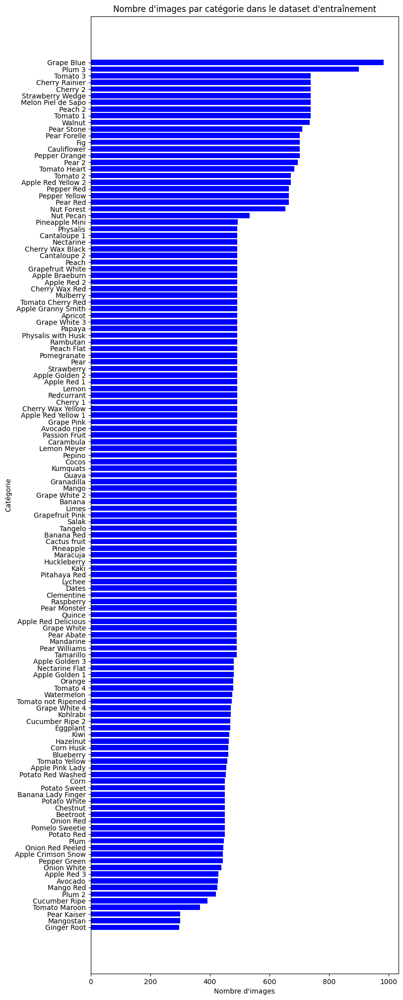

In [7]:

# Trier le DataFrame par nombre d'échantillons (optionnel)
donnees_entrainement = donnees_entrainement.sort_values(by='Nbr_images', ascending=False)

# Créer un graphique à barres
plt.figure(figsize=(8, 25))
plt.barh(donnees_entrainement['Categorie'], donnees_entrainement['Nbr_images'], color='blue')
plt.xlabel('Nombre d\'images')
plt.ylabel('Catégorie')
plt.title('Nombre d\'images par catégorie dans le dataset d\'entraînement')
plt.gca().invert_yaxis()
plt.show()


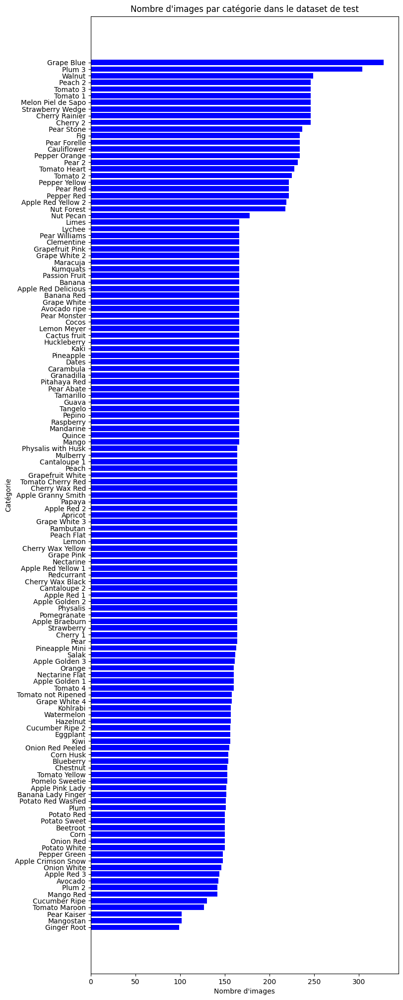

In [8]:
# Trier le DataFrame par nombre d'échantillons (optionnel)
donnees_test = donnees_test.sort_values(by='Nbr_images', ascending=False)

# Créer un graphique à barres
plt.figure(figsize=(8, 25))
plt.barh(donnees_test['Categorie'], donnees_test['Nbr_images'], color='blue')
plt.xlabel('Nombre d\'images')
plt.ylabel('Catégorie')
plt.title('Nombre d\'images par catégorie dans le dataset de test')  
plt.gca().invert_yaxis()
plt.show()


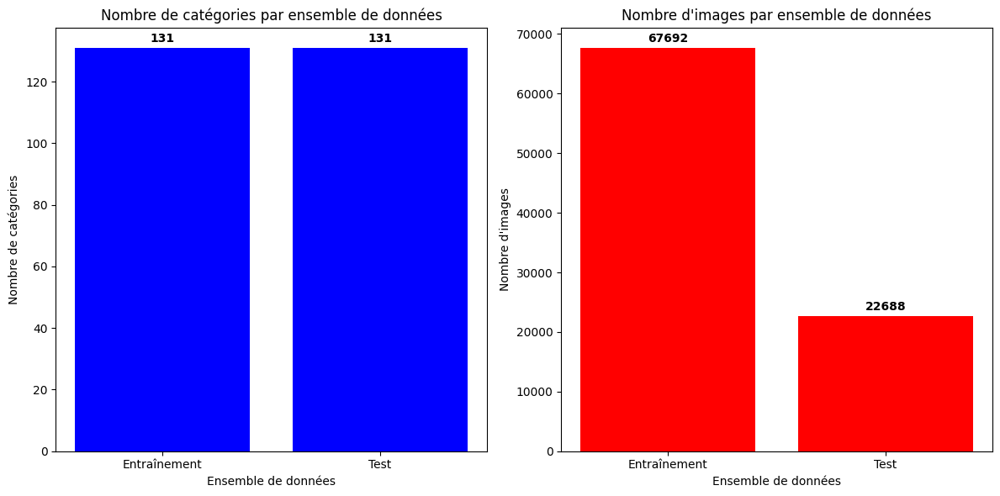

In [9]:
import matplotlib.pyplot as plt
import numpy as np

# Données
labels = ['Entraînement', 'Test']
nb_categories = [donnees_entrainement['Categorie'].nunique(), donnees_test['Categorie'].nunique()]
nb_images = [donnees_entrainement['Nbr_images'].sum(), donnees_test['Nbr_images'].sum()]

# Créer un graphique pour le nombre de catégories
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)  # Créer la première sous-figure

# Créer le graphique à barres
bars = plt.bar(labels, nb_categories, color='blue')
plt.xlabel('Ensemble de données')
plt.ylabel('Nombre de catégories')
plt.title('Nombre de catégories par ensemble de données')

# Ajouter les nombres en gras sur les barres
for bar, nb in zip(bars, nb_categories):
    plt.annotate(f'{nb}', xy=(bar.get_x() + bar.get_width() / 2, bar.get_height()), xytext=(0, 3),
                 textcoords='offset points', ha='center', va='bottom', weight='bold')

# Créer un graphique pour le nombre d'images
plt.subplot(1, 2, 2)  # Créer la deuxième sous-figure

# Créer le graphique à barres
bars = plt.bar(labels, nb_images, color='r')
plt.xlabel('Ensemble de données')
plt.ylabel('Nombre d\'images')
plt.title('Nombre d\'images par ensemble de données')

# Ajouter les nombres en gras sur les barres
for bar, nb in zip(bars, nb_images):
    plt.annotate(f'{nb}', xy=(bar.get_x() + bar.get_width() / 2, bar.get_height()), xytext=(0, 3),
                 textcoords='offset points', ha='center', va='bottom', weight='bold')

plt.tight_layout()  
plt.show()
